# Conversion rate

Package requirements

In [54]:
! pip install sweetviz 
! pip install geopandas
! pip install osmnx==1.1.1
! pip install folium
! pip install mapclassify

  Using cached mapclassify-2.4.3-py3-none-any.whl (38 kB)


# Import library

In [65]:
import sweetviz as sv
import pandas as pd 
import numpy as np

# A quick look of the data

In [6]:
df=pd.read_csv('conversion_project.csv')
df.head()

,country,age,new_user,source,total_pages_visited,converted
0,UK,25,1,Ads,1,0
1,US,23,1,Seo,5,0
2,US,28,1,Seo,4,0
3,China,39,1,Seo,5,0
4,US,30,1,Seo,6,0


## SweetVIZ EDA report

In [7]:
analyze_report = sv.analyze(df)

                                             |          | [  0%]   00:00 -> (? left)


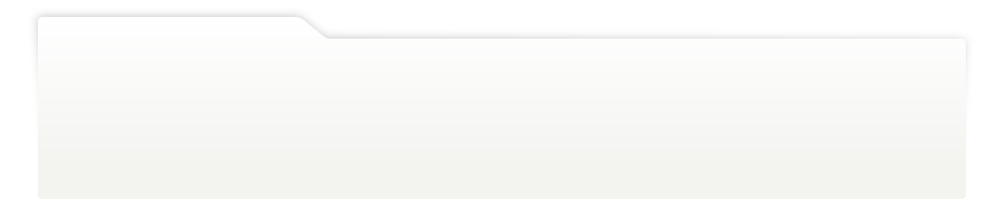
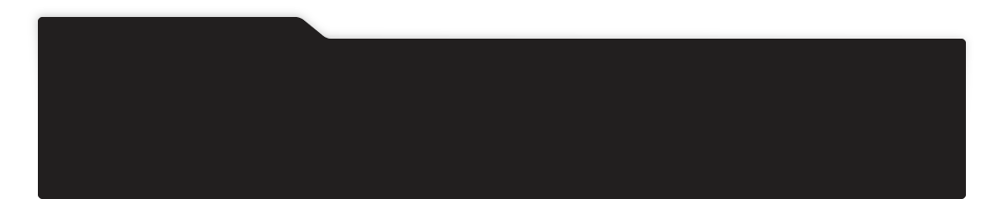
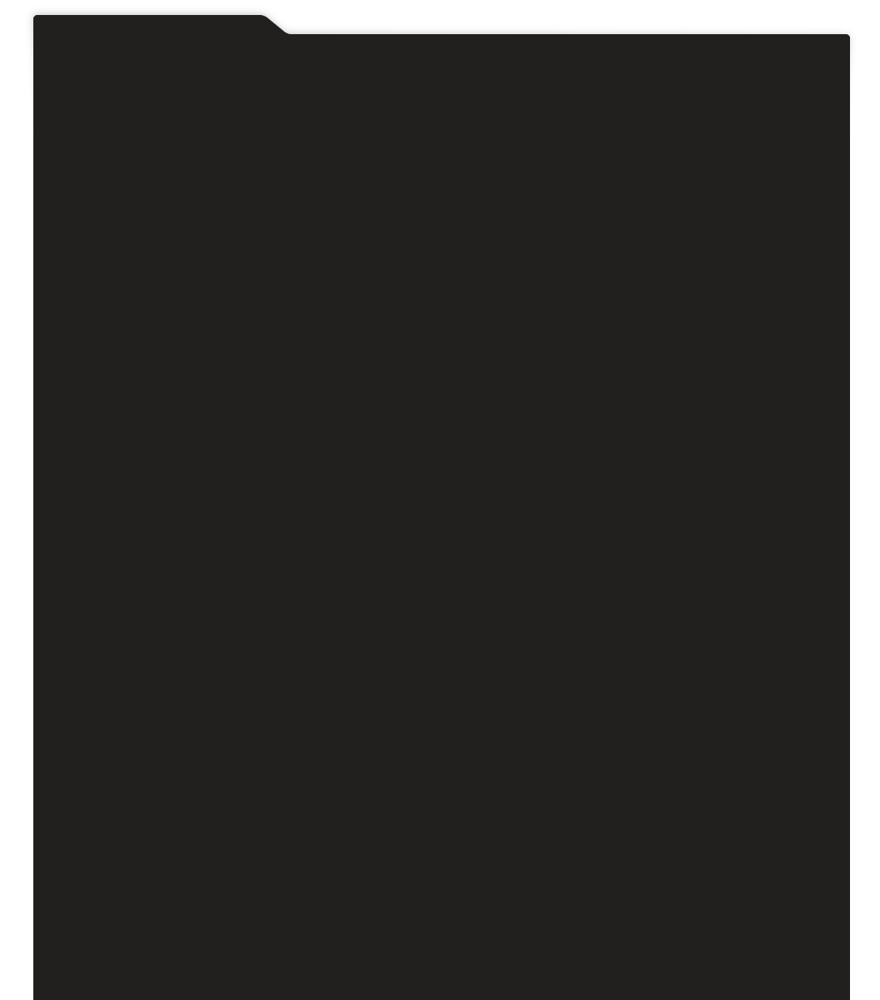
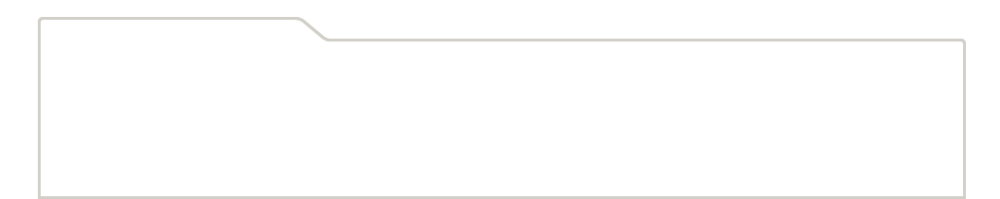
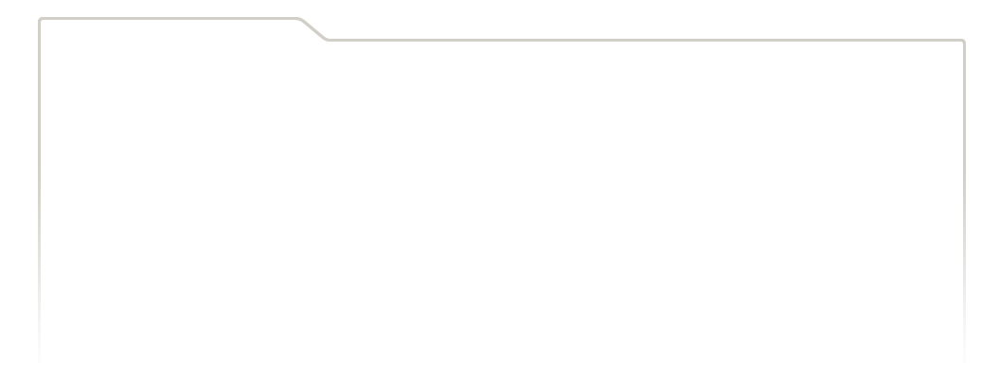
...
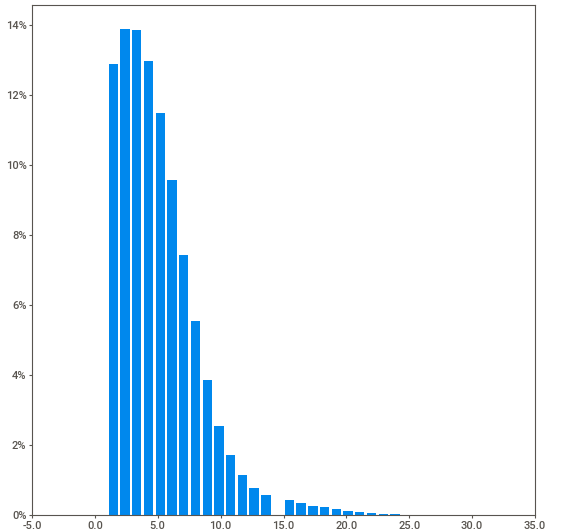
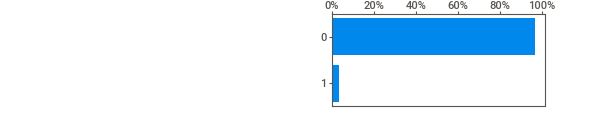
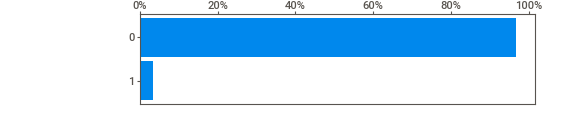
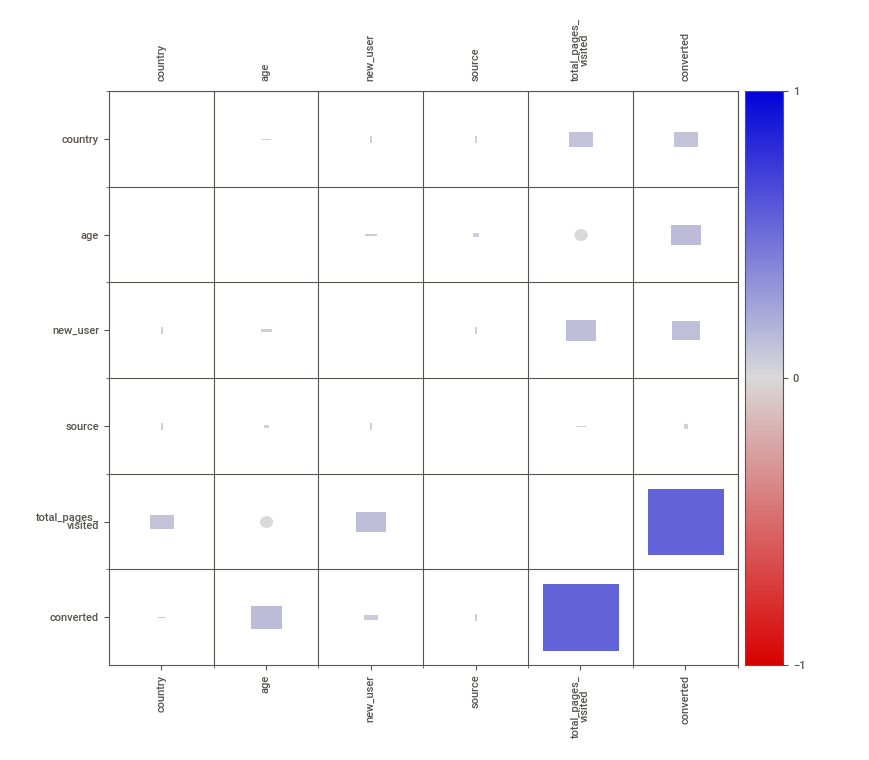
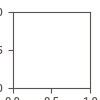

In [8]:
analyze_report.show_notebook(layout='vertical')

## Comparison of converted and not converted groups

In [91]:
analyze_report_comp = sv.compare_intra(df, df["converted"] == 0, ["converted", "not converted"])

                                             |          | [  0%]   00:00 -> (? left)


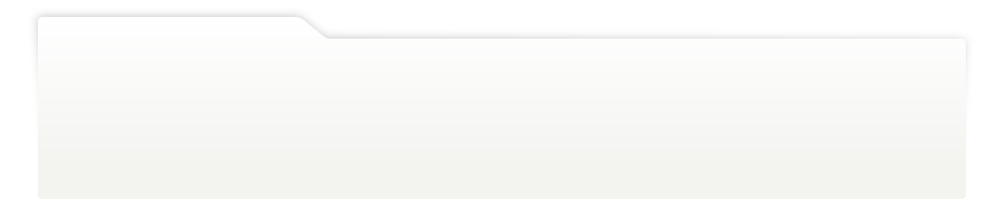
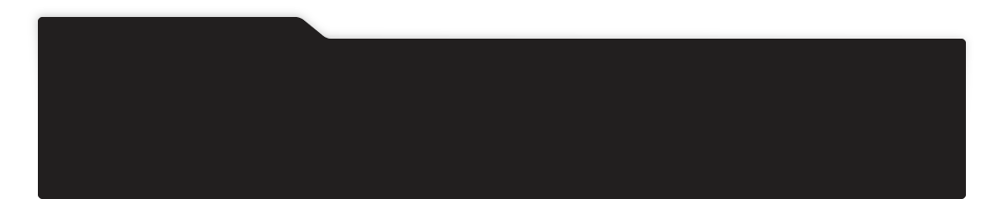
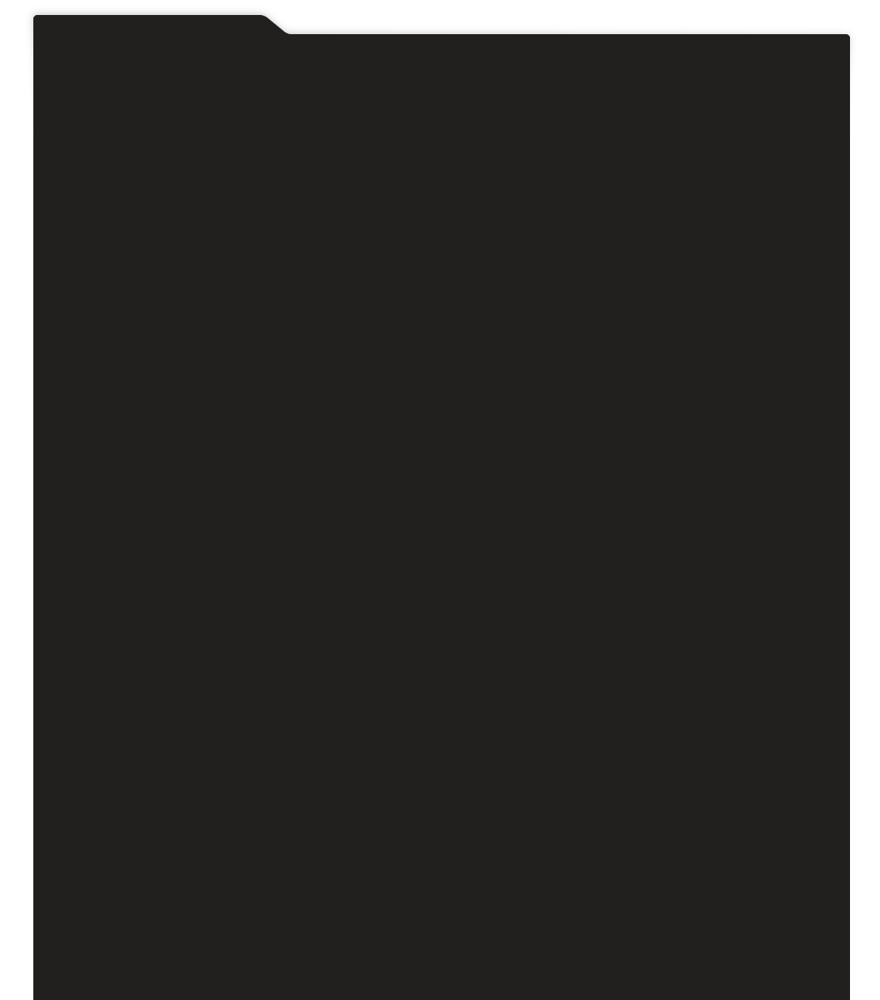
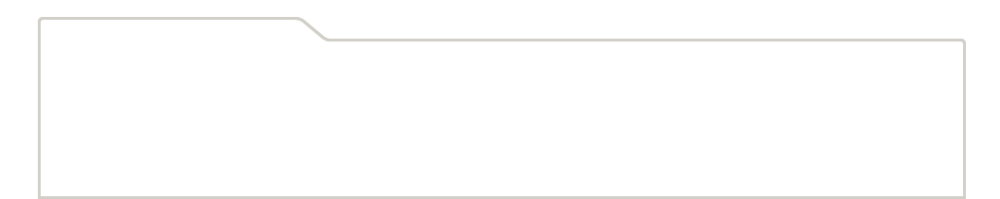
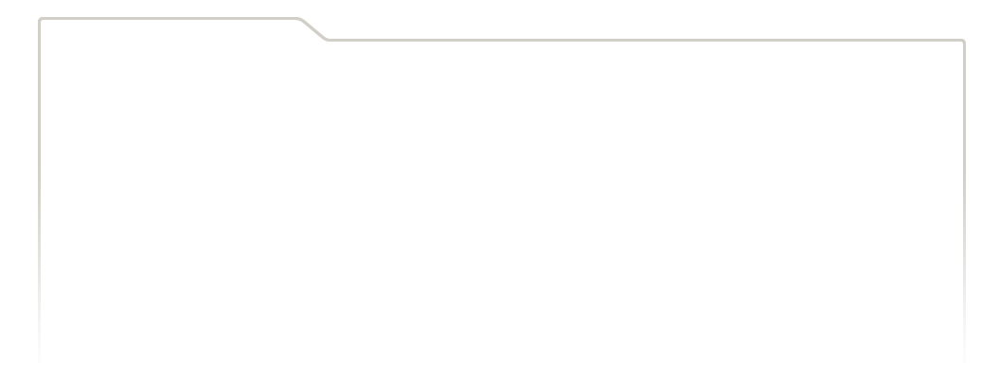
...
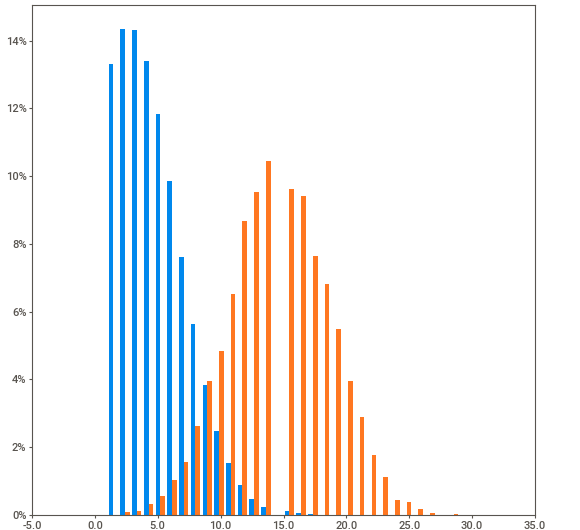
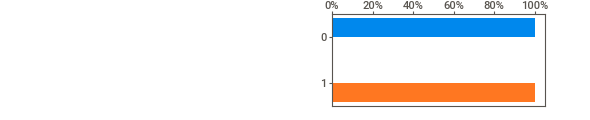
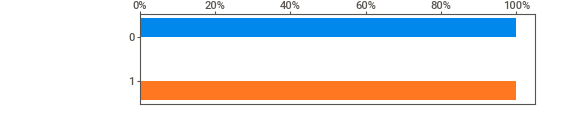
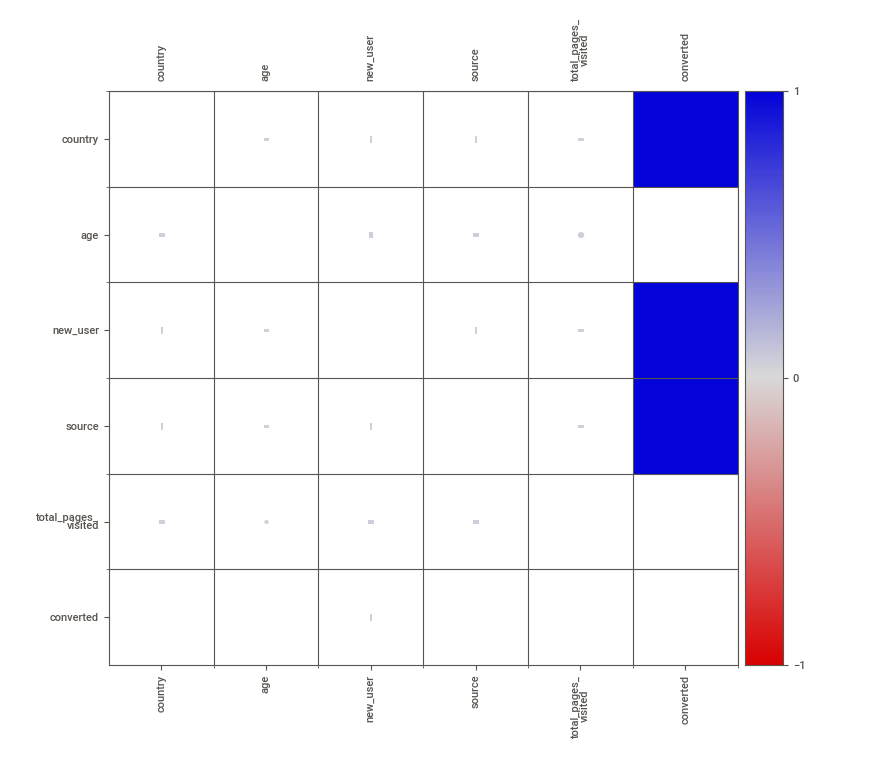
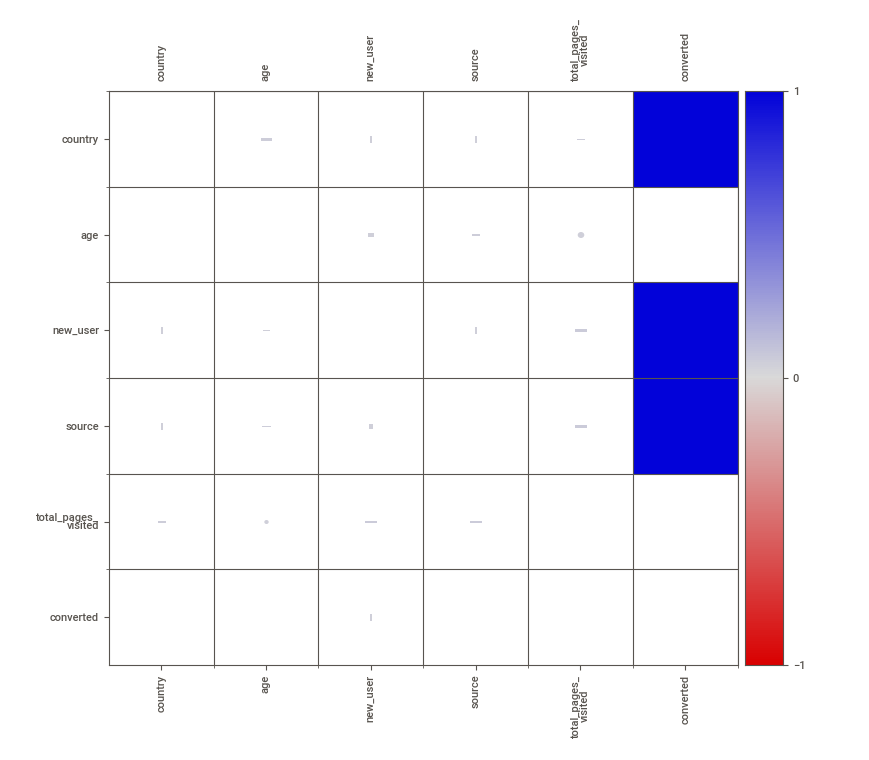

In [92]:
analyze_report_comp.show_notebook()

# Visualization on the map

In [17]:
import geopandas as gpd
import osmnx as ox

In [26]:
polygon=ox.geocode_to_gdf(list(gdf.country.unique()))
polygon['country']=list(gdf.country.unique())
polygon

c:\Users\Ray\anaconda3\lib\site-packages\osmnx\geocoder.py:110: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  gdf = gdf.append(_geocode_query_to_gdf(q, wr, by_osmid))
c:\Users\Ray\anaconda3\lib\site-packages\osmnx\geocoder.py:110: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  gdf = gdf.append(_geocode_query_to_gdf(q, wr, by_osmid))
c:\Users\Ray\anaconda3\lib\site-packages\osmnx\geocoder.py:110: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  gdf = gdf.append(_geocode_query_to_gdf(q, wr, by_osmid))
c:\Users\Ray\anaconda3\lib\site-packages\osmnx\geocoder.py:110: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  gdf = gdf.append(_geocode_query_t

,geometry,bbox_north,bbox_south,bbox_east,bbox_west,place_id,osm_type,osm_id,lat,lon,display_name,class,type,importance,country
0,"MULTIPOLYGON (((-14.01552 57.60263, -14.01459 ...",61.061000,49.674000,2.091912,-14.015517,297365518,relation,62149,54.702354,-3.276575,United Kingdom,boundary,administrative,0.872378,UK
1,"MULTIPOLYGON (((-180.00000 51.79409, -179.9926...",71.604822,-14.760836,180.000000,-180.000000,298043907,relation,148838,39.783730,-100.445882,United States,boundary,administrative,0.935691,US
2,"MULTIPOLYGON (((73.49973 39.38174, 73.50003 39...",53.560815,8.653747,134.775456,73.499735,297121566,relation,270056,35.000074,104.999927,China,boundary,administrative,0.988827,China
3,"MULTIPOLYGON (((10.45444 47.55580, 10.45569 47...",55.099161,47.270111,15.041931,5.866315,297629585,relation,51477,51.163818,10.447831,Germany,boundary,administrative,0.999681,Germany


In [74]:
gdf = gpd.GeoDataFrame(df.groupby('country').agg({"converted":sum,"total_pages_visited":np.mean,"age":np.mean,"new_user":sum}).merge(polygon[['country','geometry']],on='country'))
gdf

,country,converted,total_pages_visited,age,new_user,geometry
0,China,102,4.553523,30.672972,53508,"MULTIPOLYGON (((73.49973 39.38174, 73.50003 39..."
1,Germany,816,5.190717,30.449985,8842,"MULTIPOLYGON (((10.45444 47.55580, 10.45569 47..."
2,UK,2550,5.082167,30.451538,32938,"MULTIPOLYGON (((-14.01552 57.60263, -14.01459 ..."
3,US,6732,4.930160,30.566482,121456,"MULTIPOLYGON (((-180.00000 51.79409, -179.9926..."


In [80]:
gdf.explore(column='converted',cmap="YlGnBu")

# Some questions and statistic tests

In [93]:
import scipy.stats as stats
import numpy as np 

## 1. Do the coversion rates vary in different countries?

In [94]:
## preparing pivot table
pv1=df.pivot_table(index="converted",columns='country',values='age',aggfunc={'age': 'count'})
pv1

country,China,Germany,UK,US
converted,,,,
0,76500,12240,45900,171360
1,102,816,2550,6732


### Chi2 test for the contingency table

In [100]:
chi2,p,dof,_=stats.chi2_contingency(pv1,correction=False)
print(f"Chi2 result of the contingency table: {chi2}, p-value: {p}")

Chi2 result of the contingency table: 3548.9189906314095, p-value: 0.0


#### post hoc test

In [101]:
for i in range(len(pv1.columns)-1):
    for j in range(i+1,len(pv1.columns)):
        chi2,p,dof,_=stats.chi2_contingency(pv1[pv1.columns[[i,j]]],correction=True)
        print(f"Chi2 paired comparison of {pv1.columns[i]} and {pv1.columns[j]} with Bonferroni correction of the contingency table: {chi2}, p-value: {p}")

Chi2 paired comparison of China and Germany with Bonferroni correction of the contingency table: 4112.399530918732, p-value: 0.0
Chi2 paired comparison of China and UK with Bonferroni correction of the contingency table: 3760.2730777133884, p-value: 0.0
Chi2 paired comparison of China and US with Bonferroni correction of the contingency table: 2726.7809364148134, p-value: 0.0
Chi2 paired comparison of Germany and UK with Bonferroni correction of the contingency table: 19.170699369660273, p-value: 1.195341846641199e-05
Chi2 paired comparison of Germany and US with Bonferroni correction of the contingency table: 195.00367105616712, p-value: 2.5716405693336984e-44
Chi2 paired comparison of UK and US with Bonferroni correction of the contingency table: 212.82906780246873, p-value: 3.316366928813052e-48


## 2. Do the coversion rates vary in age?

 Non-parametric test is used as age distribution is not normal distributed

In [147]:
stat,p,m,table=stats.median_test(df.loc[df.converted==0,["age"]].to_numpy().squeeze(),df.loc[df.converted==1,["age"]].to_numpy().squeeze())
print(f"Mood’s median test comparison of age between converted and not converted t={stat}, p-value: {p}. The median difference is {df.loc[df.converted==0,['age']].median()-df.loc[df.converted==1,['age']].median()}")

Mood’s median test comparison of age between converted and not converted t=1826.4068255380519, p-value: 0.0. The median difference is age    5.0
dtype: float64


## 3. Do the coversion rates vary in new users and old users?

In [142]:
pv2=df.pivot_table(index="converted",columns='new_user',values='age',aggfunc={'age': 'count'})
chi2,p,dof,tab=stats.chi2_contingency(pv2,correction=False)
print(f"Chi2 result of the contingency table: {chi2}, p-value: {p}")
pv2

Chi2 result of the contingency table: 7341.466961081593, p-value: 0.0


new_user,0,1
converted,,
0,92295,213705
1,7161,3039


# 4. How many pages do people visited to convert

In [145]:
stat,p,m,table=stats.median_test(df.loc[df.converted==0,["total_pages_visited"]].to_numpy().squeeze(),df.loc[df.converted==1,["total_pages_visited"]].to_numpy().squeeze())
print(f"Mood’s median test comparison of age between converted and not converted t={stat}, p-value: {p}. The median difference is {df.loc[df.converted==0,['total_pages_visited']].median()-df.loc[df.converted==1,['total_pages_visited']].median()}")

Mood’s median test comparison of age between converted and not converted t=11938.209080063792, p-value: 0.0. The mean difference is total_pages_visited   -10.0
dtype: float64
